# 14. 거울아 거울아, 나는 멍멍이 상이니, 아니면 냥이 상이니?
- 학습 목표
    - 이미지를 분류할 때 이미 잘 학습되어 있는 모델을 사용한다는 아이디어를 떠올릴 수 있다.
    - 사전학습 모델인 Backbone 모델의 종류와 개념을 알고, Transfer Learning의 개념을 설명할 수 있다.
    - VGG, ResNet과 같은 기본적인 Backbone 모델을 불러와서 사용할 수 있다.
    - Backbone 모델을 원하는 레이어(layer)만큼 새로 학습시켜서 사용할 수 있다.
    - Backbone 모델을 Transfer Learning 시킴으로써 원하는 이미지를 분류시킬 수 있다.

In [1]:
import warnings
warnings.filterwarnings("ignore")

print("완료!")

완료!


## 14.2 내가 직접 만드는 강아지 고양이 분류기 (1) 이미지 분류 문제
- TensorFlow를 활용해서 이미지를 분류할 수 있는 모델을 설계

In [2]:
import tensorflow as tf
print(tf.__version__)

2.6.0


## 14.3 내가 직접 만드는 강아지 고양이 분류기 (2) 모델이 학습하려면? 공부할 데이터를 줘야지!

### 모델 학습을 위한 데이터셋(dataset) 준비하기
- tesnorflow_datasets : 텐서플로우가 제공하는 데이터셋 모음집
- 데이터 : https://www.tensorflow.org/datasets/catalog/overview#all_datasets

In [4]:
import tensorflow_datasets as tfds

tfds.__version__

'4.4.0'

- 훈련 데이터 80%, 검증 데이터 10%, 테스트 데이터 10%

In [5]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'cats_vs_dogs',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True,
)

In [6]:
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


- 모든 데이터셋은 (image, label)의 형태를 가진다. 
    - (None, None, 3) 은 image의 shape를 나타낸다
        - 이미지는 (height, width, channel)로 3차원 데이터이기 때문에 (None, None, 3)과 같이 나타난다
        - None으로 나타난 이유는 모든 이미지의 크기가 전부 다르기 때문이다
        - 3은 이미지의 색을 표현하는 채널의 수를 나타낸다
    - () 은 정답 카테고리인 label의 shape를 나타낸다
        

## 14.4 내가 직접 만드는 강아지 고양이 분류기 (3) 데이터가 있다고 끝은 아니야, 이쁘게 다듬는 작업은 필수!

### 데이터 시각화를 통해 확인하고, 모델에 입력할 수 있는 형태로 전처리하기

In [7]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

print("슝~")

슝~


- raw_train 안에 있는 데이터를 확인해 보기 위해 tf.data.Dataset에서 제공하는 take라는 함수를 사용
- 이 함수는 인수로 받은 만큼의 개수만큼의 데이터를 추출하여 새로운 데이터셋 인스턴스를 생성하여 리턴하는 함수

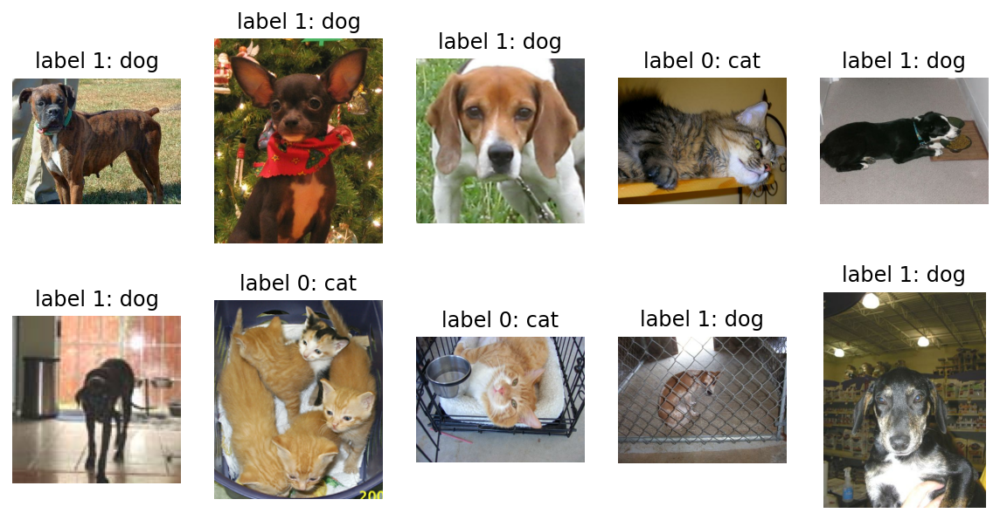

In [8]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

- format_example() 함수를 이용해 이미지를 같은 포맷으로 통일

In [9]:
IMG_SIZE = 160 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

print("슝~")

슝~


- 픽셀값의 scale을 수정하면 픽셀 값의 범위는 -1 ~ 1 로 변함

In [10]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>


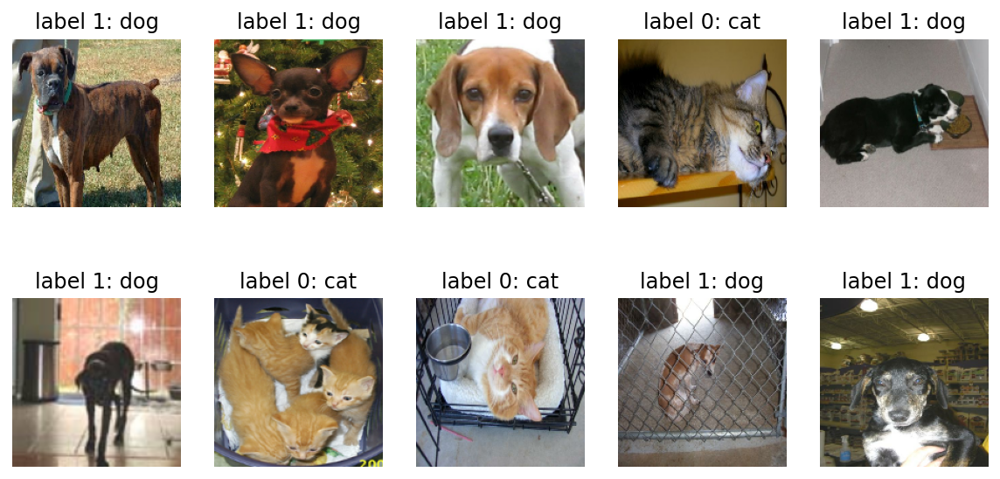

In [11]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

- raw_train을 train으로 바꾸었다
- matplotlib으로 이미지를 시각화 할 경우에는 모든 픽셀값이 양수여야 하므로, \-1 ~ 1 사이의 픽셀값을 1을 더한 후 2로 나눠서 0~1 사이의 값으로 변환하였다

## 14.5 내가 직접 만드는 강아지 고양이 분류기 (4) 데이터가 준비되었으니, 이제 모델을 만들어보자

### 텐서플로우를 활용해 모델 구조 설계하기
- 먼저 모델 생성에 필요한 함수들을 가져온다

In [12]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

print("슝~")

슝~


1. models 는 모델 그 자체를 구축하기 위한 함수들을 포함
2. layers에는 모델의 구성 요소인 여러 가지 종류의 레이어(layer), 즉 "층"이라는 함수들을 가지고 있다
3. Sequential은 말 그대로 "연속적인" 모델을 쌓기 위한 함수
4. Sequential 함수 안에 연속적으로 여러 가지 레이어들이 들어간다

In [13]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=2, activation='softmax')
])

print("슝~")

슝~


In [14]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 25600)             0

1. 첫 번째 차원은 데이터의 개수를 나타낸다. 여기서는 None 기호로 표시되어 있는데 이는 배치(batch) 사이즈에 따라 모델에 다른 수의 입력이 들어올 수 있음을 나타낸다
2. 데이터 하나의 크기는 (height, width, channel)로 3차원이다
3. 6개의 레이어를 지나면서 height와 width는 점점 작아지고, channel은 점점 커지다가, flatten 계층을 만나 25,600(20x20x64)이라는 하나의 숫자로, 즉 1차원으로 shape가 줄어든다
4. Dense 레이어에서 512개의 노드로 축소시켜 최종 출력은 단 두 개의 숫자로 구성된 하나의 확률분포를 내뱉게 된다. 이 두 숫자는 각각 입력된 이미지가 강아지일 확률과 고양이인 확률을 의미한다

-  CNN(Convolutional Neural Net)에서 점점 작은 feature map이 출력되다가, Flatten과 Dense 레이어를 거쳐 1차원으로 shape이 줄어드는 네트워크는 CNN을 사용한 딥러닝 모델의 가장 대표적인 형태
- Convolutional(합성곱) 연산을 통해 이미지는 형태가 점점 길쭉해지다가, Flatten 레이어를 만나면 한줄로 펴진다. 즉 3차원 이미지를 1차원으로 펼치는 것

In [15]:
import numpy as np

image = np.array([[1, 2], [3, 4]])
print(image.shape)
image

(2, 2)


array([[1, 2],
       [3, 4]])

In [16]:
image.flatten()

array([1, 2, 3, 4])

## 14.6 내가 직접 만드는 강아지 고양이 분류기 (5) 모델아 모델아, 데이터를 먹고 똑똑해지렴!

### 모델 compile 완료 후 학습시키기
- 모델이 학습하는 데에 필요한 "학습률"(learning_rate)이라는 파라미터를 0.0001로 설정해주고, 모델을 compile 하여 학습할 수 있는 형태로 변환

In [17]:
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

print("슝~")

슝~


- compile 을 하기 위해서는 세 가지가 필요.
    1. optimizer 는 학습을 어떤 방식으로 시킬 것인지 정한다. 최적화 함수라고 부르기도 한다
    2. loss 는 모델이 학습해나가야 하는 방향을 결정한다. 
    3. metrics 는 모델의 성능을 평가하는 척도. 성능을 평가할 수 있는 지표는 정확도(accuracy), 정밀도(precision), 재현율(recall) 등이 있다.

In [18]:
# 한 스텝에 학습시킬 데이터의 개수인 BATCH_SIZE와 학습 데이터를 적절히 섞어줄 SHUFFLE_BUFFER_SIZE를 설정

BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000
print("슝~")

슝~


- BATCH_SIZE에 따라 32개의 데이터를 랜덤으로 뿌려줄 train_batches, validation_batches, test_batches를 만들어 준다

In [19]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)
print("슝~")

슝~


In [20]:
# 확인

for image_batch, label_batch in train_batches.take(1):
    pass

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

- 초기 모델의 성능은 어떤지 확인
- validation(검증)을 하기 위한 데이터셋인 validation_batches를 이용해 20번의 예측을 해 보고 평균 loss와 평균 accuracy를 확인

In [21]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

 9/20 [============>.................] - ETA: 0s - loss: 0.6906 - accuracy: 0.5556

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


20/20 [==============================] - 6s 61ms/step - loss: 0.7049 - accuracy: 0.5297
initial loss: 0.70
initial accuracy: 0.53


Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


### 모델 학습

In [22]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
168/582 [=======>......................] - ETA: 34s - loss: 0.6709 - accuracy: 0.6034

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 31s - loss: 0.6649 - accuracy: 0.6097

210/582 [=========>....................] - ETA: 30s - loss: 0.6627 - accuracy: 0.6125

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.6454 - accuracy: 0.6289

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.6100 - accuracy: 0.6621

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


502/582 [========================>.....] - ETA: 6s - loss: 0.6090 - accuracy: 0.6628

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


513/582 [=========================>....] - ETA: 5s - loss: 0.6076 - accuracy: 0.6640

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


540/582 [==========================>...] - ETA: 3s - loss: 0.6050 - accuracy: 0.6661

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


546/582 [===========================>..] - ETA: 2s - loss: 0.6047 - accuracy: 0.6664

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.6005 - accuracy: 0.6705

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 54s 86ms/step - loss: 0.6005 - accuracy: 0.6705 - val_loss: 0.5379 - val_accuracy: 0.7356
Epoch 2/10
168/582 [=======>......................] - ETA: 33s - loss: 0.5171 - accuracy: 0.7504

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 30s - loss: 0.5152 - accuracy: 0.7500

210/582 [=========>....................] - ETA: 29s - loss: 0.5121 - accuracy: 0.7512

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 23s - loss: 0.5087 - accuracy: 0.7532

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.4919 - accuracy: 0.7628

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


502/582 [========================>.....] - ETA: 6s - loss: 0.4912 - accuracy: 0.7634

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


513/582 [=========================>....] - ETA: 5s - loss: 0.4905 - accuracy: 0.7632

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


540/582 [==========================>...] - ETA: 3s - loss: 0.4885 - accuracy: 0.7644

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


546/582 [===========================>..] - ETA: 2s - loss: 0.4879 - accuracy: 0.7645

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.4882 - accuracy: 0.7639

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 52s 85ms/step - loss: 0.4881 - accuracy: 0.7640 - val_loss: 0.4963 - val_accuracy: 0.7558
Epoch 3/10
168/582 [=======>......................] - ETA: 33s - loss: 0.4425 - accuracy: 0.7945

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 30s - loss: 0.4353 - accuracy: 0.7983

210/582 [=========>....................] - ETA: 29s - loss: 0.4354 - accuracy: 0.7975

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.4336 - accuracy: 0.8003

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


491/582 [========================>.....] - ETA: 7s - loss: 0.4227 - accuracy: 0.8097

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


504/582 [========================>.....] - ETA: 6s - loss: 0.4214 - accuracy: 0.8105

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.4209 - accuracy: 0.8108

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.4193 - accuracy: 0.8117

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.4188 - accuracy: 0.8121

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.4184 - accuracy: 0.8117

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 52s 85ms/step - loss: 0.4182 - accuracy: 0.8118 - val_loss: 0.5401 - val_accuracy: 0.7382
Epoch 4/10
169/582 [=======>......................] - ETA: 16s - loss: 0.3855 - accuracy: 0.8275

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


203/582 [=========>....................] - ETA: 15s - loss: 0.3835 - accuracy: 0.8296

211/582 [=========>....................] - ETA: 15s - loss: 0.3848 - accuracy: 0.8298

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 12s - loss: 0.3795 - accuracy: 0.8315

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.3671 - accuracy: 0.8389

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.3661 - accuracy: 0.8395

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.3650 - accuracy: 0.8404

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.3635 - accuracy: 0.8415

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.3630 - accuracy: 0.8418

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.3637 - accuracy: 0.8404

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 44ms/step - loss: 0.3636 - accuracy: 0.8404 - val_loss: 0.4614 - val_accuracy: 0.7889
Epoch 5/10
171/582 [=======>......................] - ETA: 17s - loss: 0.3296 - accuracy: 0.8584

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


203/582 [=========>....................] - ETA: 15s - loss: 0.3290 - accuracy: 0.8605

213/582 [=========>....................] - ETA: 15s - loss: 0.3297 - accuracy: 0.8603

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 12s - loss: 0.3237 - accuracy: 0.8623

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.3123 - accuracy: 0.8682

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.3123 - accuracy: 0.8682

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.3111 - accuracy: 0.8687

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.3085 - accuracy: 0.8695

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.3080 - accuracy: 0.8698

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.3084 - accuracy: 0.8695

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 44ms/step - loss: 0.3084 - accuracy: 0.8696 - val_loss: 0.5801 - val_accuracy: 0.7459
Epoch 6/10
169/582 [=======>......................] - ETA: 17s - loss: 0.2752 - accuracy: 0.8820

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


201/582 [=========>....................] - ETA: 16s - loss: 0.2734 - accuracy: 0.8840

213/582 [=========>....................] - ETA: 15s - loss: 0.2758 - accuracy: 0.8834

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 12s - loss: 0.2684 - accuracy: 0.8875

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.2575 - accuracy: 0.8928

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.2577 - accuracy: 0.8932

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.2567 - accuracy: 0.8940

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.2549 - accuracy: 0.8953

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.2557 - accuracy: 0.8947

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.2551 - accuracy: 0.8950

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 44ms/step - loss: 0.2549 - accuracy: 0.8951 - val_loss: 0.4989 - val_accuracy: 0.7842
Epoch 7/10
170/582 [=======>......................] - ETA: 16s - loss: 0.2225 - accuracy: 0.9156

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.2210 - accuracy: 0.9158

212/582 [=========>....................] - ETA: 15s - loss: 0.2209 - accuracy: 0.9158

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.2158 - accuracy: 0.9179

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.2061 - accuracy: 0.9217

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.2054 - accuracy: 0.9222

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.2046 - accuracy: 0.9226

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


544/582 [===========================>..] - ETA: 1s - loss: 0.2038 - accuracy: 0.9226

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


550/582 [===========================>..] - ETA: 1s - loss: 0.2036 - accuracy: 0.9227

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.2023 - accuracy: 0.9235

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 43ms/step - loss: 0.2024 - accuracy: 0.9235 - val_loss: 0.8538 - val_accuracy: 0.6960
Epoch 8/10
170/582 [=======>......................] - ETA: 17s - loss: 0.1812 - accuracy: 0.9322

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.1785 - accuracy: 0.9336

212/582 [=========>....................] - ETA: 15s - loss: 0.1779 - accuracy: 0.9337

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 12s - loss: 0.1713 - accuracy: 0.9360

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.1614 - accuracy: 0.9412

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.1612 - accuracy: 0.9415

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.1596 - accuracy: 0.9425

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.1583 - accuracy: 0.9429

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.1577 - accuracy: 0.9432

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.1565 - accuracy: 0.9438

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 44ms/step - loss: 0.1564 - accuracy: 0.9438 - val_loss: 0.5925 - val_accuracy: 0.7803
Epoch 9/10
169/582 [=======>......................] - ETA: 17s - loss: 0.1287 - accuracy: 0.9569

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 16s - loss: 0.1293 - accuracy: 0.9570

212/582 [=========>....................] - ETA: 15s - loss: 0.1303 - accuracy: 0.9562

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.1234 - accuracy: 0.9585

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.1175 - accuracy: 0.9599

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.1167 - accuracy: 0.9603

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.1157 - accuracy: 0.9609

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.1143 - accuracy: 0.9615

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.1142 - accuracy: 0.9615

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.1132 - accuracy: 0.9621

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 44ms/step - loss: 0.1131 - accuracy: 0.9621 - val_loss: 0.6128 - val_accuracy: 0.7876
Epoch 10/10
170/582 [=======>......................] - ETA: 17s - loss: 0.0921 - accuracy: 0.9693

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.0910 - accuracy: 0.9706

212/582 [=========>....................] - ETA: 15s - loss: 0.0921 - accuracy: 0.9698

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.0880 - accuracy: 0.9722

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.0819 - accuracy: 0.9747

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.0829 - accuracy: 0.9740

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.0822 - accuracy: 0.9743

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.0803 - accuracy: 0.9750

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.0800 - accuracy: 0.9752

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.0803 - accuracy: 0.9750

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 44ms/step - loss: 0.0803 - accuracy: 0.9751 - val_loss: 0.6545 - val_accuracy: 0.7859


## 14.7 내가 직접 만드는 강아지 고양이 분류기 (6) 모델은 얼마나 똑똑해졌을까? 확인해 보자!

- accuracy : 훈련 데이터셋에 대한 정확도
- val_accuracy : 검증 데이터셋에 대한 정확도. 학습하지 않고 있는, 즉 해당 학습 단계에서 보지 않은 데이터에 대한 정확도

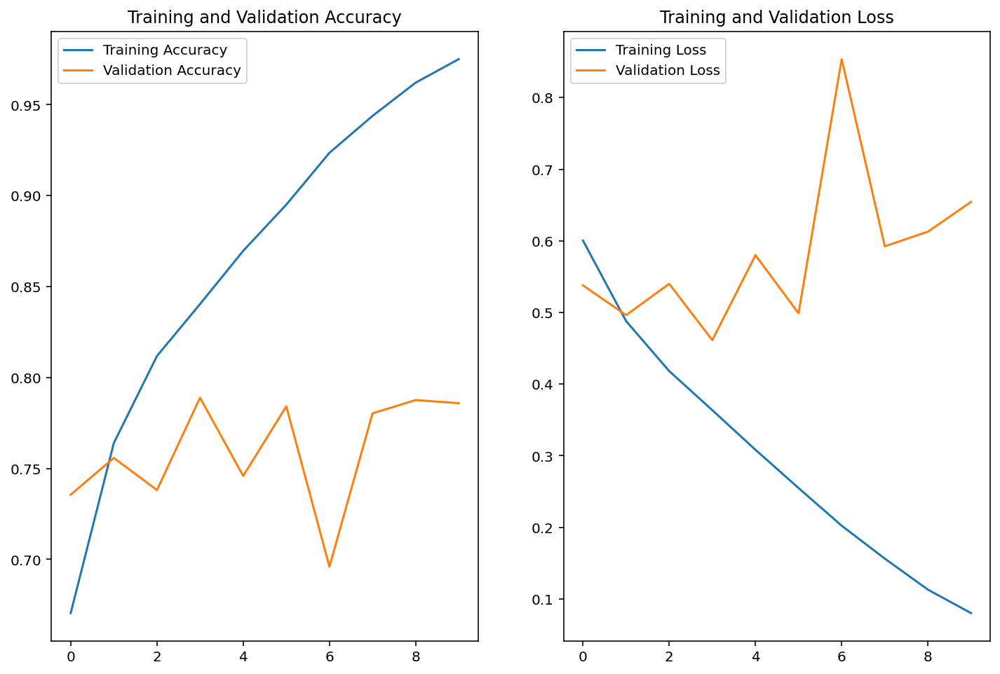

In [23]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

- training accuracy는 현재 학습하는 데이터셋에 대한 정확도이기 때문에 모델의 구조나 데이터셋 등에 문제가 없다면 일반적으로 학습하면 할수록 꾸준히 계속 오른다.
- 반면 validation accuracy는 학습하지 않은 데이터셋에 대한 정확도이기 때문에 일정수준까지 오른 후에는 계속 오를지 장담할 수 없다

#### 과적합(Overfitting)
- 모델의 성능이 제대로 올라가려면 "학습하지 않은" 데이터에 대해서도 성능이 좋아야 하는데, 훈련 데이터만으로 계속 학습하다 보니 그 데이터에만 과도하게 적합(fitting) 되어서 일반화 능력이 떨어지게 되는 것
- 딥러닝 모델을 학습시킬 때는 과적합 문제를 예민하게 다루고, 과적합이 되지 않는 순간을 잘 잡아내 일반화가 잘 되는 모델로 학습시키는 것이 중요

In [24]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.99950528e-01, 4.94277811e-05],
       [9.66491759e-01, 3.35082263e-02],
       [1.01231135e-01, 8.98768842e-01],
       [9.99974728e-01, 2.52665177e-05],
       [5.31733334e-01, 4.68266636e-01],
       [4.69317734e-02, 9.53068197e-01],
       [1.90605840e-03, 9.98093903e-01],
       [9.15161252e-01, 8.48386735e-02],
       [1.54117256e-01, 8.45882714e-01],
       [1.13826513e-01, 8.86173487e-01],
       [1.58857368e-02, 9.84114289e-01],
       [9.95935440e-01, 4.06454038e-03],
       [9.99058783e-01, 9.41263163e-04],
       [1.85780573e-05, 9.99981403e-01],
       [9.77663398e-01, 2.23366730e-02],
       [9.99865174e-01, 1.34808171e-04],
       [1.27839282e-01, 8.72160673e-01],
       [4.96811845e-06, 9.99994993e-01],
       [4.14529979e-01, 5.85470021e-01],
       [9.31909323e-01, 6.80906624e-02],
       [1.29422024e-01, 8.70577931e-01],
       [9.87116635e-01, 1.28833270e-02],
       [9.97030854e-01, 2.96918419e-03],
       [9.64145958e-01, 3.58539782e-02],
       [9.206120

- 이 값들은 모델이 판단한 [고양이일 확률, 강아지일 확률]인데, [1.0, 0.0]에 가까울수록 label이 0인 고양이로, [0.0, 1.0]에 가까울수록 label이 1인 강아지로 예측했다고 볼 수 있다

In [25]:
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 0])

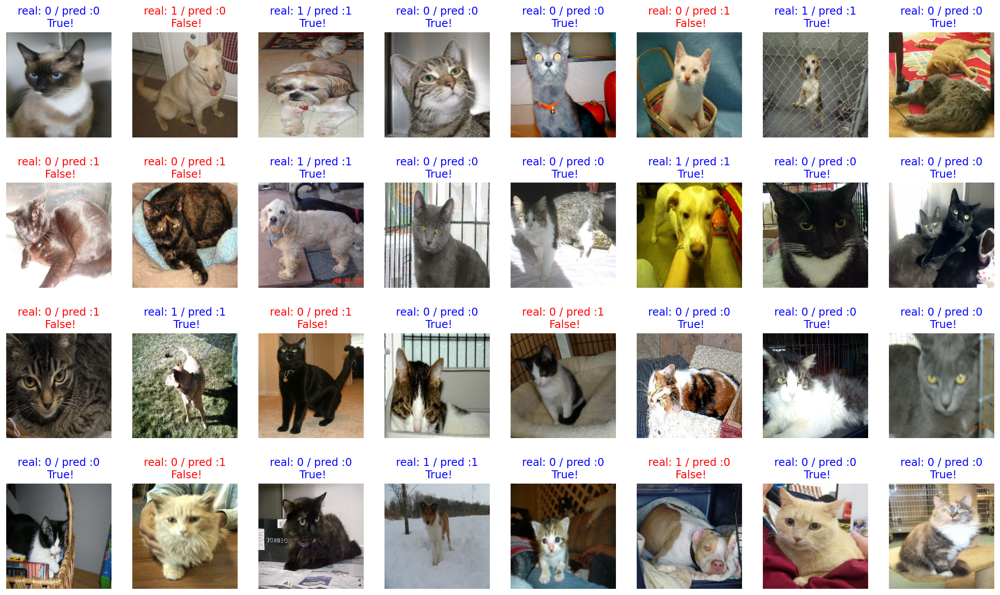

In [26]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [29]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count += 1

print(count / 32 * 100)

71.875


## 14.8 내가 직접 만들지 않고 가져다 쓰는 강아지 고양이 분류기 (1) 어려운 문제는 직접 풀지 말자, 똑똑한 누군가가 이미 풀어놨을 테니!

### 이미지 분류 대회인 ILSVRC와 데이터셋 ImageNet
- IBSVRC(이미지넷 이미지 인식 대회)

### Transfer Learning
- https://jeinalog.tistory.com/13
- 누군가 이미 잘 만들어놓은 모델을 가져와서, 내 입맛에 맞게 일부분만 새로 학습시켜 사용하는 것이다. 

## 14.9 내가 직접 만들지 않고 가져다 쓰는 강아지 고양이 분류기 (2) 아주 똑똑한 모델을 간단히 가져오는 방법

### 사전 학습 모델인 VGG16을 가져오고, 모델의 구조 확인하기
- VGG 모델을 base_model의 변수로 불러온다
- VGG 모델을 가져올 때, output에 가까운 높은 레벨에 있는 3개의 FC레이어는 제외하고 불러와야 하므로 include_top = False 옵션을 주었다
- https://www.tensorflow.org/api_docs/python/tf/keras/applications/vgg16/VGG16

In [30]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [31]:
image_batch.shape

TensorShape([32, 160, 160, 3])

32는 이미지 장수, 즉 32장의 이미지가 들어있고 각 이미지의 크기는 (160,160,3)

In [32]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

이 벡터는 이미지에서 특징을 추출해 낸 "특징 벡터"라고 부르기도 한다

In [33]:
# 모델 구조
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

- https://neurohive.io/en/popular-networks/vgg16/
-  VGG16 모델에는 총 네 가지 종류의 레이어만 쓰였는데 그 중 우리는 Dense 레이어로 이루어진 블록이 빠졌다. 이 블록은 우리가 Transfer Learning을 수행하며 새로 학습시킬 것이기 때문에 빠진 부분이다

## 14.10 내가 직접 만들지 않고 가져다 쓰는 강아지 고양이 분류기 (3) 모델의 마지막 부분만, 내 입맛대로 재구성하기

### VGG16 끝단에 classifier 레이어를 붙여서 원하는 구조의 분류 모델 만들기
- classifier를 구성하려면 Fully connected 레이어로 구성
- Fully connected 레이어에 입력될 수 있는 벡터는 반드시 1차원이어야 한다

In [34]:
feature_batch.shape

TensorShape([32, 5, 5, 512])

- classifier를 구성하기 전에 3차원 벡터를 1차원 벡터로 변환하는 작업을 거쳐야 한다
- 이 역할을 하는 계층이 Flatten 레이어

In [35]:
import numpy as np

image = np.array([[1, 2],
                  [3, 4]])

flattened_image = image.flatten()

print("Original image:\n", image)
print("Original image shape:", image.shape)
print()
print("Flattened image:\n", flattened_image)
print("Flattened image shape:", flattened_image.shape)

Original image:
 [[1 2]
 [3 4]]
Original image shape: (2, 2)

Flattened image:
 [1 2 3 4]
Flattened image shape: (4,)


####  Global Average Pooling
- 2차원 또는 3차원 벡터를 1차원으로 축소하는 방법에는 Flattening하는 것보다 조금 더 좋은 방법
- 평균값을 활용해 벡터의 차원을 줄이는 방법


In [36]:
# Global Average Pooling 계층을 만드는 코드
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
print("슝~")

슝~


In [37]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [38]:
# Dense 레이어들을 붙여주면 classifier가 완성
dense_layer = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(2, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 2)


In [40]:
# base_model 은 학습을 시키지 않을 예정이니 학습 여부를 결정하는 trainable 변수를 False로 지정
base_model.trainable = False
print("슝~")

슝~


In [41]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])
print("슝~")

슝~


In [42]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 1026      
Total params: 14,978,370
Trainable params: 263,682
Non-trainable params: 14,714,688
_________________________________________________________________


## 14.11 내가 직접 만들지 않고 가져다 쓰는 강아지 고양이 분류기 (4) 거인의 어깨에 올라타서 예측하니, 더 잘 예측할 수밖에!

### VGG16을 기반으로 구성된 이미지 분류기를 학습시키고, 직접 만들었던 모델과 결과 비교해 보기

In [43]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [44]:
# 학습이 되지 않은 상태
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

 6/20 [========>.....................] - ETA: 0s - loss: 0.7203 - accuracy: 0.4427

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


18/20 [==========================>...] - ETA: 0s - loss: 0.7228 - accuracy: 0.4635

Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


20/20 [==============================] - 5s 61ms/step - loss: 0.7215 - accuracy: 0.4688
initial loss: 0.72
initial accuracy: 0.47


In [45]:
EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/5
167/582 [=======>......................] - ETA: 33s - loss: 0.3935 - accuracy: 0.8664

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 30s - loss: 0.3709 - accuracy: 0.8755

210/582 [=========>....................] - ETA: 30s - loss: 0.3652 - accuracy: 0.8774

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.3299 - accuracy: 0.8877

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.2746 - accuracy: 0.9031

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.2724 - accuracy: 0.9033

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.2696 - accuracy: 0.9043

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.2654 - accuracy: 0.9059

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.2641 - accuracy: 0.9065

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.2587 - accuracy: 0.9083

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 58s 97ms/step - loss: 0.2587 - accuracy: 0.9083 - val_loss: 0.1795 - val_accuracy: 0.9308
Epoch 2/5
167/582 [=======>......................] - ETA: 33s - loss: 0.1645 - accuracy: 0.9334

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 30s - loss: 0.1645 - accuracy: 0.9348

210/582 [=========>....................] - ETA: 29s - loss: 0.1663 - accuracy: 0.9344

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.1653 - accuracy: 0.9338

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1622 - accuracy: 0.9352

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1615 - accuracy: 0.9355

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1615 - accuracy: 0.9353

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1598 - accuracy: 0.9362

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1596 - accuracy: 0.9362

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1593 - accuracy: 0.9361

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 52s 88ms/step - loss: 0.1593 - accuracy: 0.9361 - val_loss: 0.1548 - val_accuracy: 0.9321
Epoch 3/5
167/582 [=======>......................] - ETA: 33s - loss: 0.1454 - accuracy: 0.9368

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 30s - loss: 0.1446 - accuracy: 0.9388

210/582 [=========>....................] - ETA: 30s - loss: 0.1439 - accuracy: 0.9393

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.1471 - accuracy: 0.9388

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1485 - accuracy: 0.9385

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1476 - accuracy: 0.9389

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1465 - accuracy: 0.9394

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1465 - accuracy: 0.9389

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1467 - accuracy: 0.9390

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1457 - accuracy: 0.9397

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 52s 88ms/step - loss: 0.1457 - accuracy: 0.9397 - val_loss: 0.1464 - val_accuracy: 0.9394
Epoch 4/5
167/582 [=======>......................] - ETA: 33s - loss: 0.1320 - accuracy: 0.9409

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 30s - loss: 0.1352 - accuracy: 0.9420

210/582 [=========>....................] - ETA: 29s - loss: 0.1353 - accuracy: 0.9421

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.1398 - accuracy: 0.9404

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1405 - accuracy: 0.9417

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1410 - accuracy: 0.9414

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1406 - accuracy: 0.9415

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1401 - accuracy: 0.9418

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1398 - accuracy: 0.9418

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1389 - accuracy: 0.9422

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 52s 88ms/step - loss: 0.1389 - accuracy: 0.9422 - val_loss: 0.1422 - val_accuracy: 0.9402
Epoch 5/5
167/582 [=======>......................] - ETA: 33s - loss: 0.1305 - accuracy: 0.9467

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 30s - loss: 0.1324 - accuracy: 0.9463

210/582 [=========>....................] - ETA: 29s - loss: 0.1330 - accuracy: 0.9460

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.1358 - accuracy: 0.9457

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1357 - accuracy: 0.9452

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1356 - accuracy: 0.9453

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1354 - accuracy: 0.9454

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1348 - accuracy: 0.9458

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1345 - accuracy: 0.9459

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1340 - accuracy: 0.9459

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 52s 88ms/step - loss: 0.1340 - accuracy: 0.9459 - val_loss: 0.1398 - val_accuracy: 0.9415


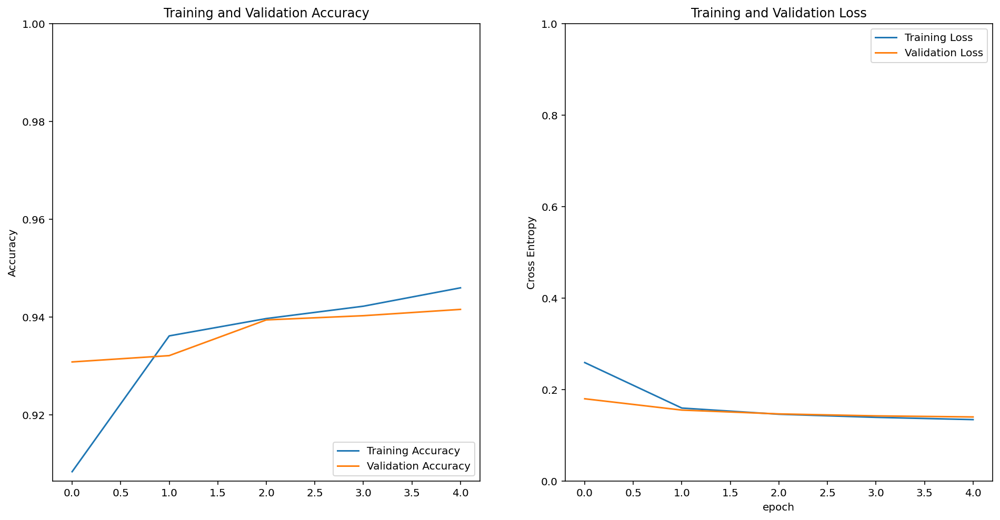

In [46]:
# 학습 과정

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [47]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.9998963e-01, 1.0427893e-05],
       [1.7018265e-01, 8.2981735e-01],
       [3.3368614e-01, 6.6631389e-01],
       [9.9999511e-01, 4.8627294e-06],
       [9.9855047e-01, 1.4495110e-03],
       [9.8707515e-01, 1.2924816e-02],
       [1.7870445e-04, 9.9982136e-01],
       [6.8273914e-01, 3.1726083e-01],
       [9.4998962e-01, 5.0010342e-02],
       [9.6629345e-01, 3.3706535e-02],
       [8.8632776e-05, 9.9991131e-01],
       [9.9995983e-01, 4.0114806e-05],
       [9.8824114e-01, 1.1758866e-02],
       [4.0936297e-06, 9.9999595e-01],
       [9.9892396e-01, 1.0760480e-03],
       [9.8812205e-01, 1.1877893e-02],
       [9.9685490e-01, 3.1450645e-03],
       [3.7951846e-02, 9.6204817e-01],
       [6.2490797e-01, 3.7509203e-01],
       [9.9541336e-01, 4.5867199e-03],
       [9.2018569e-01, 7.9814255e-02],
       [9.8301286e-01, 1.6987141e-02],
       [9.9470156e-01, 5.2984408e-03],
       [9.8010892e-01, 1.9891076e-02],
       [9.9868912e-01, 1.3108847e-03],
       [9.8133320e-01, 1.

In [48]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0])

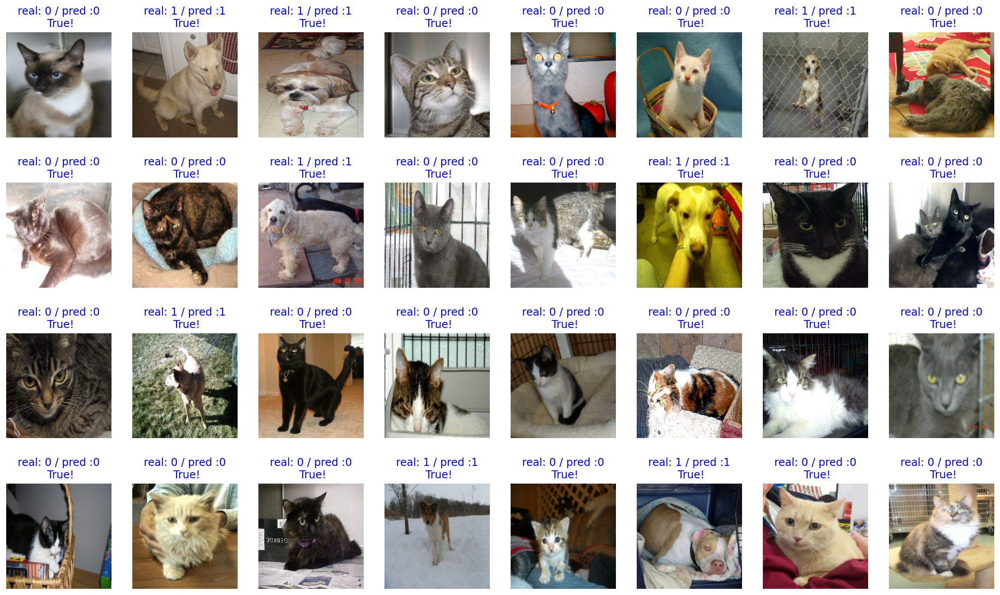

In [49]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [50]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외

100.0


## 14.12 내가 직접 만들지 않고 가져다 쓰는 강아지 고양이 분류기 (5) 잘 학습된 모델은 저장해두고, 언제든 꺼내 쓰도록 하자!

### 모델을 save하고, 다시 load 해와서 사용하는 방법 익히기
- save_weights 함수를 활용해서 모델을 저장

In [51]:
import os

checkpoint_dir = os.getenv("HOME") + "/aiffel/cat_vs_dog/checkpoint"
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')
    
model.save_weights(checkpoint_file_path)     # checkpoint 파일 생성

if os.path.exists(checkpoint_file_path):
  print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!


## 14.13  내가 직접 만들지 않고 가져다 쓰는 강아지 고양이 분류기 (6) 거울아 거울아, 나는 멍멍이 상이니, 아니면 냥이 상이니?

### 학습된 모델에 원하는 이미지를 입력해 예측 결과 확인해 보기

In [52]:
img_dir_path = os.getenv("HOME") + "/aiffel/cat_vs_dog/images"
os.path.exists(img_dir_path)

True

In [53]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

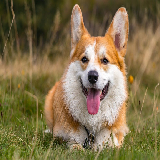

In [54]:
IMG_SIZE = 160
dog_image_path = os.path.join(img_dir_path, 'my_dog.jpg')

dog_image = load_img(dog_image_path, target_size=(IMG_SIZE, IMG_SIZE))
dog_image

In [56]:
# 모델에 넣을 수 있도록 이미지를 array, 즉 배열 자료형으로 변환
dog_image = img_to_array(dog_image).reshape(1, IMG_SIZE, IMG_SIZE, 3)
dog_image.shape

(1, 160, 160, 3)

In [57]:
prediction = model.predict(dog_image)
prediction

array([[0., 1.]], dtype=float32)

In [58]:
def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    cat_percentage = round(prediction[0] * 100)
    dog_percentage = round(prediction[1] * 100)
    print(f"This image seems {dog_percentage}% dog, and {cat_percentage}% cat.")

This image seems 100% dog, and 0% cat.


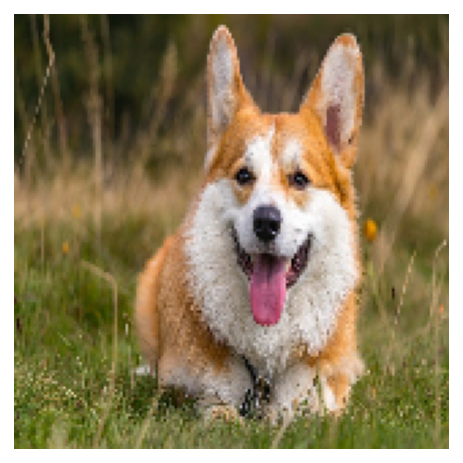

In [59]:
filename = 'my_dog.jpg'

show_and_predict_image(img_dir_path, filename)

This image seems 0% dog, and 100% cat.


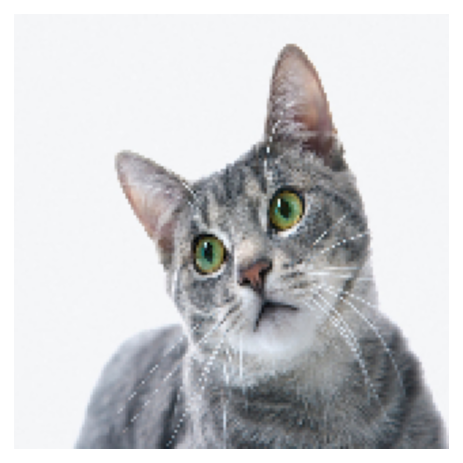

In [60]:
filename = 'my_cat.jpg'

show_and_predict_image(img_dir_path, filename)

This image seems 100% dog, and 0% cat.


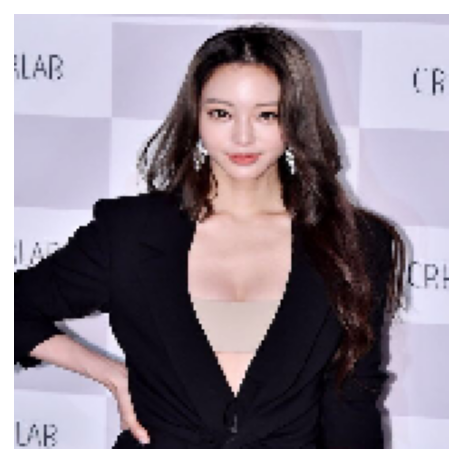

In [62]:
filename = "cat_face_1.png"
show_and_predict_image(img_dir_path, filename)